# Artifacts with DPM++ 2M SDE Karras in Diffusers

We are getting artifacts when using DPM++ 2M SDE Karras. We don't see such artifacts when running plain inferences with the same scheduler in Automatic1111. The quality is clearly very good in A1111 with this scheduler and it would be great achieving the same quality with Diffusers.

This problem happens accross different models and in general for the DPMSolverMultistepScheduler, but here we focus in the DPM++ 2M SDE Karras case.

In [1]:
from diffusers import AutoPipelineForText2Image
from diffusers.schedulers import DPMSolverMultistepScheduler, EulerDiscreteScheduler
import torch

def load_pipeline(model_id):
    pipeline = AutoPipelineForText2Image.from_pretrained(
        model_id, 
        torch_dtype=torch.float16,
        variant="fp16",
        use_safetensors=True,
    ).to("cuda")
    return pipeline

def generator():
    return torch.Generator(device="cuda").manual_seed(42)

prompt = "Adorable infant playing with a variety of colorful rattle toys."

def generate(pipe):
    results = pipe(
    prompt=prompt, 
    guidance_scale=3,
    generator=generator(),  
    num_inference_steps=25, 
    height=768, 
    width=1344)
    display(results.images[0])

def euler(pipe):
    return EulerDiscreteScheduler.from_config(pipe.scheduler.config)

def dpm_2m_sde_karras(pipe):
    return DPMSolverMultistepScheduler.from_config(
        pipe.scheduler.config, 
        use_karras_sigmas=True,
        sde_type="sde-dpmsolver++"
        )

def dpm_2m_sde_karras_patched(pipe):
    return DPMSolverMultistepScheduler.from_config(
        pipe.scheduler.config, 
        use_karras_sigmas=True,
        sde_type="sde-dpmsolver++",
        euler_at_final=True,
        use_lu_lambdas=True
        )

/home/ideprado/miniconda3/envs/diffusers_test/lib/python3.10/site-packages/transformers/utils/hub.py:123: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


# Juggernaut juggernaut-xl-v6

## Euler

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

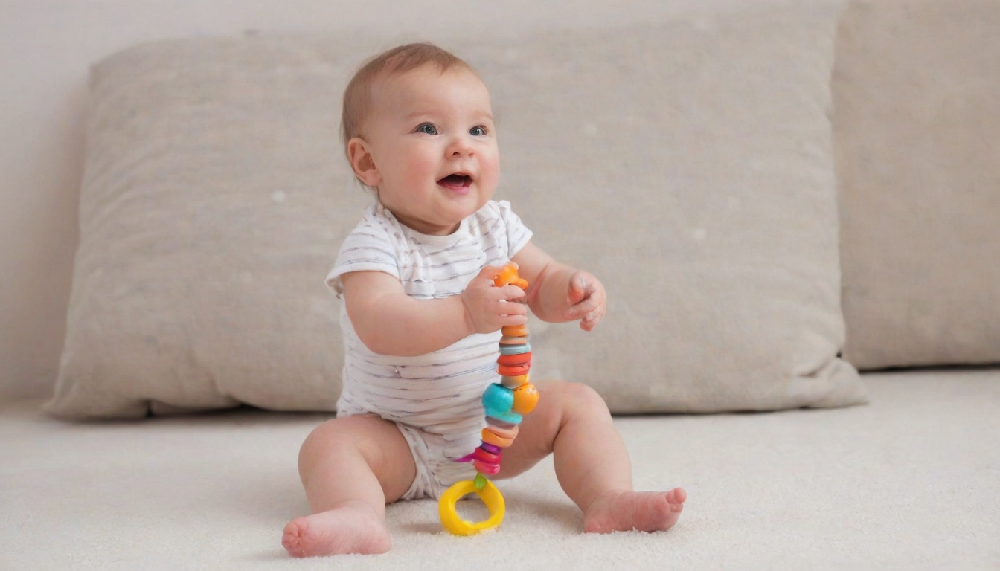

In [2]:
model_id = "frankjoshua/juggernautXL_version6Rundiffusion"
pipe = load_pipeline(model_id)
pipe.scheduler = euler(pipe)
generate(pipe)

## DPM++ 2M SDE Karras

  0%|          | 0/25 [00:00<?, ?it/s]

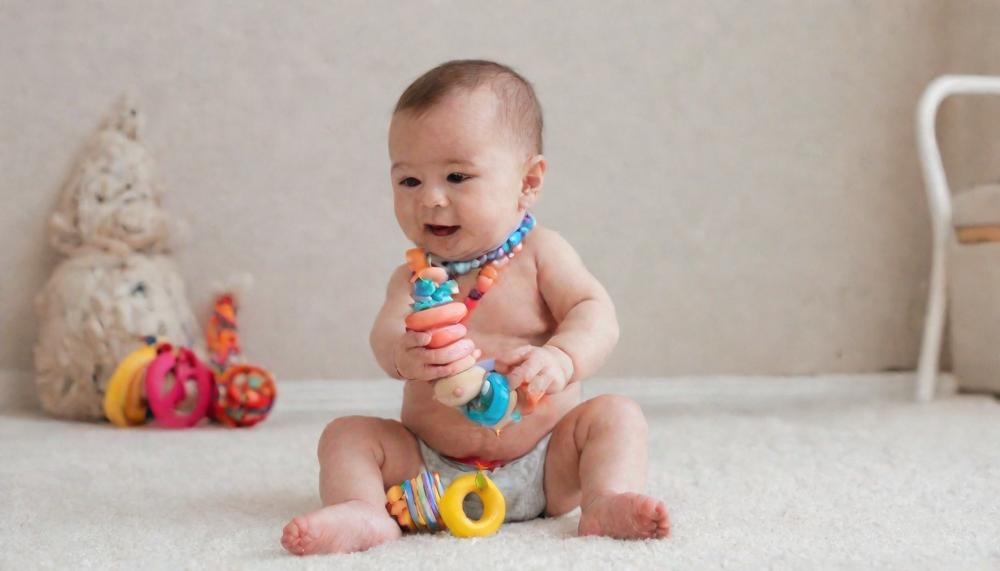

In [3]:
pipe.scheduler = dpm_2m_sde_karras(pipe)
generate(pipe)

## DPM++ 2M SDE Karras with euler_at_final and use_lu_lambdas

  0%|          | 0/25 [00:00<?, ?it/s]

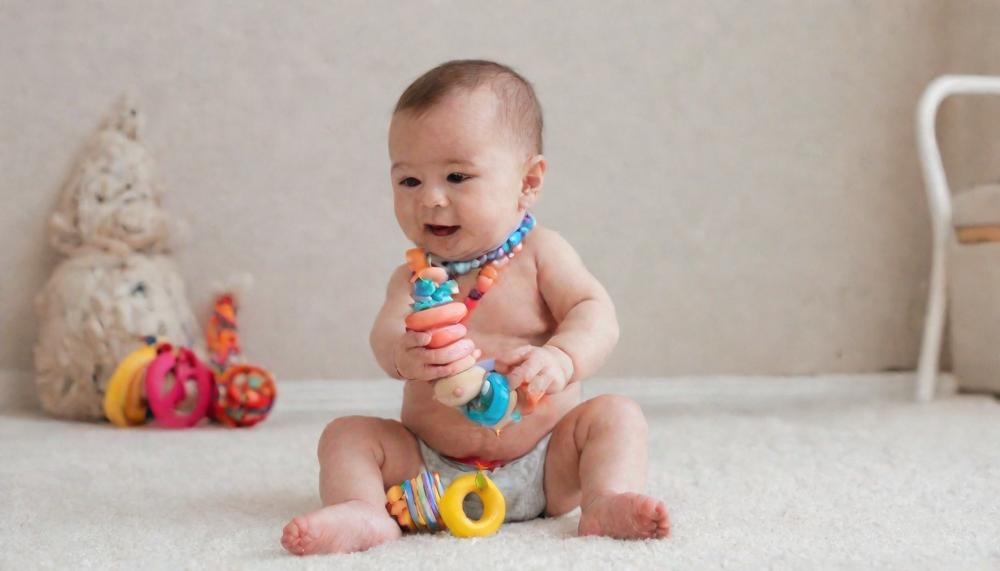

In [4]:
pipe.scheduler = dpm_2m_sde_karras_patched(pipe)
generate(pipe)

# Dreamshaper XL 1.0

## Euler

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

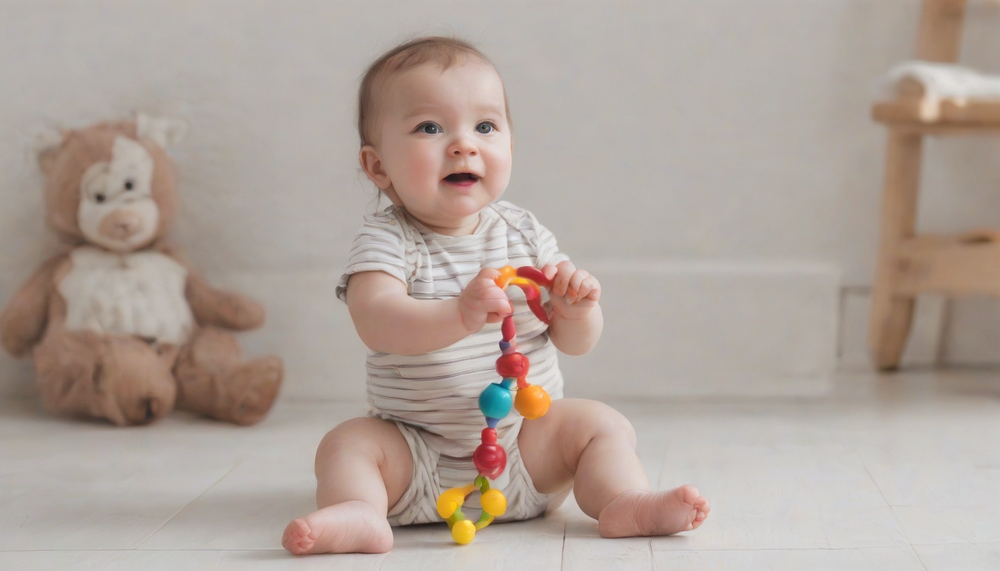

In [5]:
model_id = "Lykon/dreamshaper-xl-1-0"
pipe = load_pipeline(model_id)
pipe.scheduler = euler(pipe)
generate(pipe)

## DPM++ 2M SDE Karras

  0%|          | 0/25 [00:00<?, ?it/s]

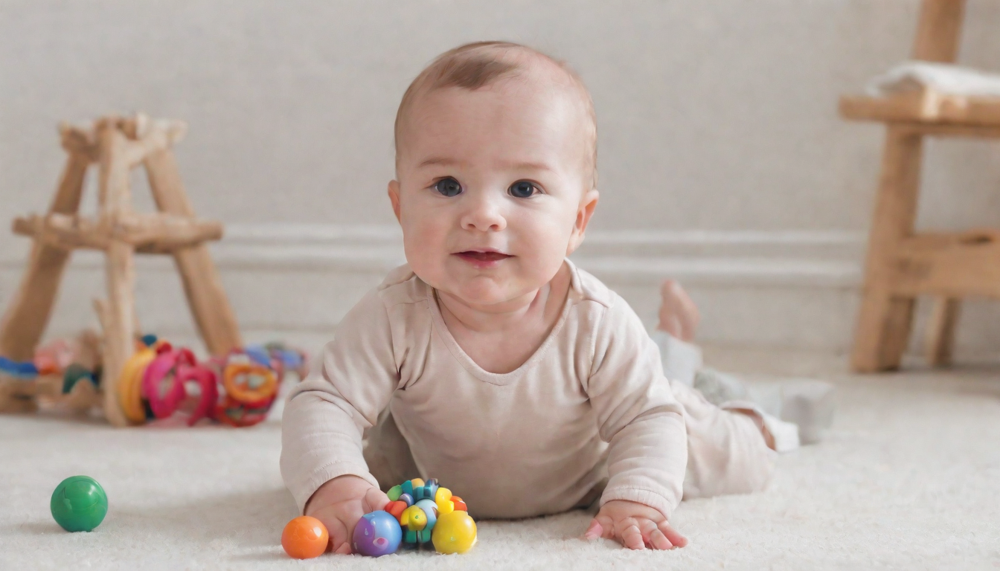

In [6]:
pipe.scheduler = dpm_2m_sde_karras(pipe)
generate(pipe)

## DPM++ 2M SDE Karras with euler_at_final and use_lu_lambdas

  0%|          | 0/25 [00:00<?, ?it/s]

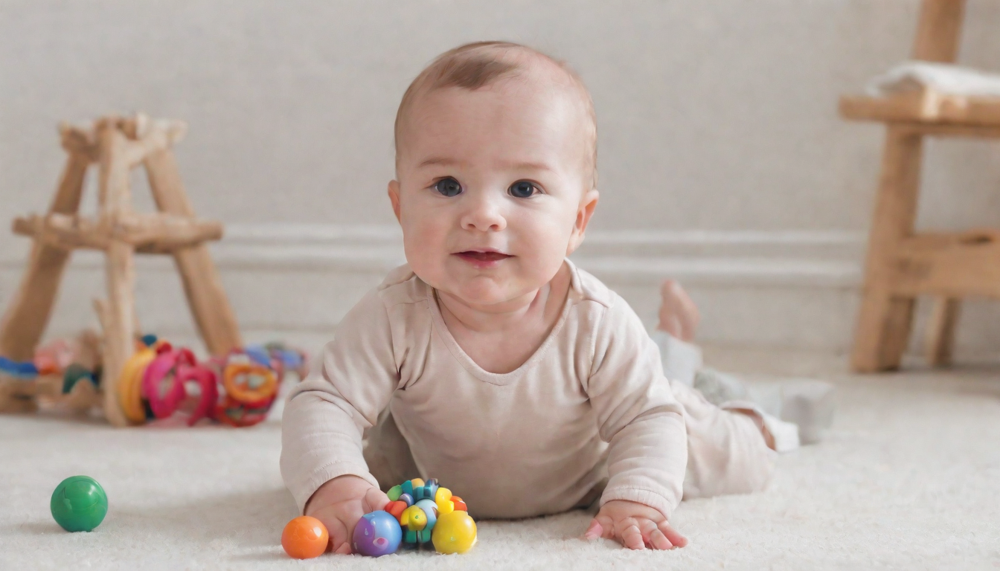

In [7]:
pipe.scheduler = dpm_2m_sde_karras_patched(pipe)
generate(pipe)

# SDXL

## Euler

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

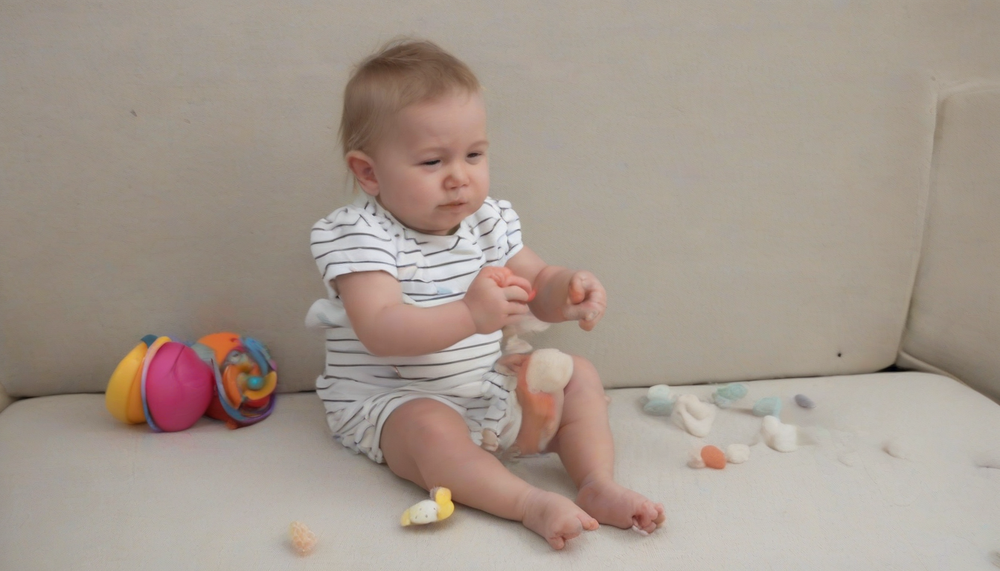

In [8]:
model_id = "stabilityai/stable-diffusion-xl-base-1.0"
pipe = load_pipeline(model_id)
pipe.scheduler = euler(pipe)
generate(pipe)

## DPM++ 2M SDE Karras

  0%|          | 0/25 [00:00<?, ?it/s]

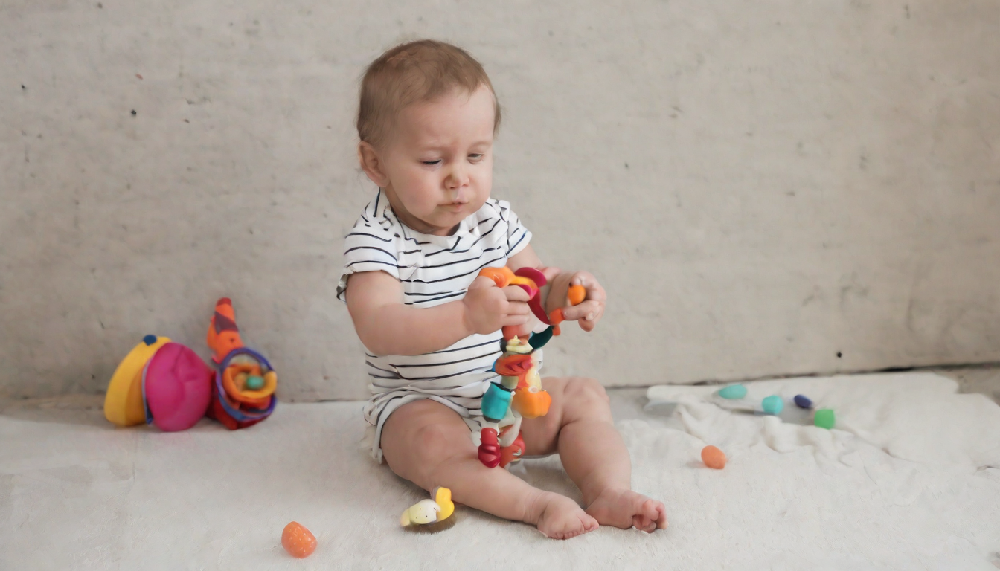

In [9]:
pipe.scheduler = dpm_2m_sde_karras(pipe)
generate(pipe)

## DPM++ 2M SDE Karras with euler_at_final and use_lu_lambdas

  0%|          | 0/25 [00:00<?, ?it/s]

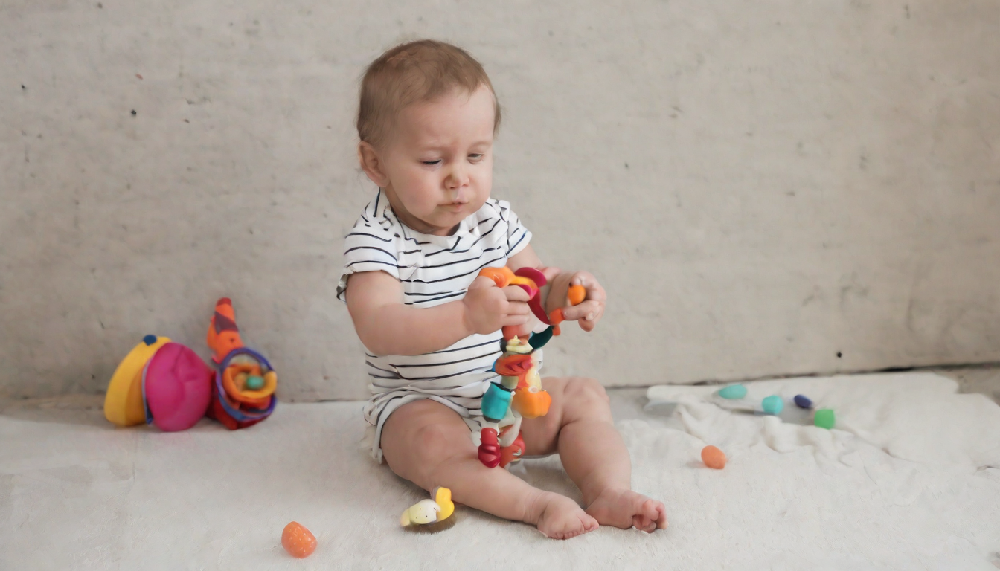

In [10]:
pipe.scheduler = dpm_2m_sde_karras_patched(pipe)
generate(pipe)